<a href="https://colab.research.google.com/github/saqlineniam/Real-Time-Apple-Detection-for-Robust-Multi-Object-Tracking-in-Orchard-Environments/blob/main/Train_YOLOv8_with_CBAM_%2B_Multiscalespatialattention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install Ultralytics (if not already installed)
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.4 MB/s eta 0:00:00


In [2]:
# Step 1: Import necessary libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
from ultralytics import YOLO
import os
import shutil
from tqdm import tqdm
import cv2
import json
import base64
import zlib

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [10]:
# --- Helper function from your code to decode the bitmaps ---
def decode_bitmap(bitmap_data):
    try:
        compressed_data = base64.b64decode(bitmap_data)
        png_data = zlib.decompress(compressed_data)
        mask_patch = cv2.imdecode(np.frombuffer(png_data, np.uint8), cv2.IMREAD_UNCHANGED)
        if len(mask_patch.shape) > 2:
            mask_patch = mask_patch[:, :, 3]
        return mask_patch
    except Exception:
        return None

def convert_to_yolo_segmentation(dataset_root, output_root):
    """
    Converts the AppleMOT dataset into the YOLOv8 segmentation format.
    """
    # Clean up previous runs
    if os.path.exists(output_root):
        shutil.rmtree(output_root)

    for split in ['train', 'testing']:
        split_name = 'val' if split == 'testing' else 'train'
        print(f"--- Processing '{split_name}' split ---")

        # Create YOLOv8 directory structure
        img_dest_dir = os.path.join(output_root, 'images', split_name)
        lbl_dest_dir = os.path.join(output_root, 'labels', split_name)
        os.makedirs(img_dest_dir, exist_ok=True)
        os.makedirs(lbl_dest_dir, exist_ok=True)

        img_src_dir = os.path.join(dataset_root, split, 'img')
        ann_src_dir = os.path.join(dataset_root, split, 'ann')

        image_filenames = sorted(os.listdir(img_src_dir))

        for filename in tqdm(image_filenames, desc=f"Converting {split_name}"):
            # Copy image file to the new structure
            shutil.copy(os.path.join(img_src_dir, filename), img_dest_dir)

            # --- Annotation Processing ---
            ann_path = os.path.join(ann_src_dir, filename + '.json')
            if not os.path.exists(ann_path): continue

            with open(ann_path, 'r') as f: ann_data = json.load(f)

            img_height = ann_data['size']['height']
            img_width = ann_data['size']['width']
            yolo_labels = []

            for obj in ann_data.get('objects', []):
                if obj.get('geometryType') != 'bitmap': continue

                # Decode the bitmap into a small mask patch
                mask_patch = decode_bitmap(obj['bitmap']['data'])
                if mask_patch is None: continue

                # Create a full-size mask and place the patch at its origin
                origin = obj['bitmap']['origin']; x_origin, y_origin = origin
                full_mask = np.zeros((img_height, img_width), dtype=np.uint8)
                h_patch, w_patch = mask_patch.shape
                y_end, x_end = min(y_origin + h_patch, img_height), min(x_origin + w_patch, img_width)
                full_mask[y_origin:y_end, x_origin:x_end] = mask_patch[:y_end-y_origin, :x_end-x_origin]

                # Find contours (polygons) from the mask
                contours, _ = cv2.findContours(full_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                if not contours: continue

                # Format each polygon for YOLO
                for contour in contours:
                    if contour.size < 6: continue # A polygon needs at least 3 points (6 values)

                    # Normalize polygon coordinates
                    normalized_contour = contour.flatten().astype(float)
                    normalized_contour[0::2] /= img_width  # Normalize x
                    normalized_contour[1::2] /= img_height # Normalize y

                    # Create the YOLO string: class_id x1 y1 x2 y2 ...
                    # Since we only have 'apple', the class_id is 0
                    yolo_string = f"0 {' '.join(map(str, normalized_contour))}"
                    yolo_labels.append(yolo_string)

            # Save the corresponding .txt label file
            label_filename = os.path.splitext(filename)[0] + '.txt'
            with open(os.path.join(lbl_dest_dir, label_filename), 'w') as f:
                f.write('\n'.join(yolo_labels))

In [11]:
# --- Convert AppleMOT to YOLO Format ---
dataset_path = "/content/drive/MyDrive/dataset-ninja/apple-mots"
output_yolo_path = "/content/drive/MyDrive/AppleMOT_YOLOv8_CBAM"
convert_to_yolo_segmentation(dataset_path, output_yolo_path)
print(f"\nConversion complete! YOLOv8 dataset is ready at: {output_yolo_path}")

# Write data.yaml for YOLOv8 model
import yaml
yolo_dataset_path = "/content/drive/MyDrive/AppleMOT_YOLOv8_CBAM"
data_yaml = {
    'path': yolo_dataset_path,
    'train': os.path.join(yolo_dataset_path, 'images/train'),
    'val': os.path.join(yolo_dataset_path, 'images/val'),
    'names': {
        0: 'apple'
    }
}
yaml_path = os.path.join(yolo_dataset_path, 'data.yaml')
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)
print(f"data.yaml file created at: {yaml_path}")

--- Processing 'train' split ---


Converting train: 100%|██████████| 1147/1147 [10:46<00:00,  1.77it/s]


--- Processing 'val' split ---


Converting val: 100%|██████████| 1051/1051 [08:32<00:00,  2.05it/s]


Conversion complete! YOLOv8 dataset is ready at: /content/drive/MyDrive/AppleMOT_YOLOv8_CBAM
data.yaml file created at: /content/drive/MyDrive/AppleMOT_YOLOv8_CBAM/data.yaml


In [1]:
# --- Install necessary libraries ---
!pip install ultralytics -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.0 MB/s eta 0:00:00


In [3]:
# --- CBAM Implementation ---
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction_ratio, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction_ratio, in_channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x).view(x.size(0), -1)).view(x.size(0), x.size(1), 1, 1)
        max_out = self.fc(self.max_pool(x).view(x.size(0), -1)).view(x.size(0), x.size(1), 1, 1)
        return x * (avg_out + max_out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        self.conv1 = nn.Conv2d(2, 1, kernel_size=kernel_size, stride=1, padding=kernel_size // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x_out = torch.cat([avg_out, max_out], dim=1)
        return x * self.sigmoid(self.conv1(x_out))

class CBAM(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = ChannelAttention(in_channels, reduction_ratio)
        self.spatial_attention = SpatialAttention(kernel_size)

    def forward(self, x):
        x = self.channel_attention(x)
        x = self.spatial_attention(x)
        return x

# --- Multi-Scale Spatial Attention (MSSA) Implementation ---
class MultiScaleSpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super(MultiScaleSpatialAttention, self).__init__()
        self.scale1 = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        self.scale2 = nn.Conv2d(in_channels, in_channels, kernel_size=5, stride=1, padding=2)
        self.scale3 = nn.Conv2d(in_channels, in_channels, kernel_size=7, stride=1, padding=3)
        self.final_conv = nn.Conv2d(in_channels * 3, in_channels, kernel_size=1)

    def forward(self, x):
        scale1_out = F.relu(self.scale1(x))
        scale2_out = F.relu(self.scale2(x))
        scale3_out = F.relu(self.scale3(x))
        x_out = torch.cat([scale1_out, scale2_out, scale3_out], dim=1)
        return self.final_conv(x_out)

# --- Occlusion-Aware Module (OAM) Implementation ---
class OcclusionAwareModule(nn.Module):
    def __init__(self, in_channels):
        super(OcclusionAwareModule, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels // 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels // 2, in_channels, kernel_size=3, padding=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.sigmoid(self.conv2(x))
        return x * x

# --- Custom YOLO Model with CBAM, MSSA, and OAM ---
class AppleYOLOv8WithCBAM(YOLO):
    def __init__(self, model='yolov8n-seg.pt', *args, **kwargs):
        super().__init__(model, *args, **kwargs)
        self.cbam = CBAM(in_channels=256)  # Adjust the channels as per YOLOv8
        self.mssa = MultiScaleSpatialAttention(in_channels=256)
        self.oam = OcclusionAwareModule(in_channels=256)

    def forward(self, x):
        # Apply CBAM, MSSA, and OAM to feature maps
        x = super().forward(x)  # Base YOLOv8 forward pass, this gives us the feature maps
        print(f"Before CBAM: {x.shape}")

        # Apply CBAM
        x = self.cbam(x)
        print(f"After CBAM: {x.shape}")

        # Apply Multi-Scale Spatial Attention
        x = self.mssa(x)
        print(f"After MSSA: {x.shape}")

        # Apply Occlusion-Aware Module
        x = self.oam(x)
        print(f"After OAM: {x.shape}")

        return x

In [5]:
# --- Train YOLOv8 with CBAM ---
data_yaml_path = "/content/drive/MyDrive/AppleMOT_YOLOv8/data.yaml"

# Load the customized YOLO model with CBAM
model = AppleYOLOv8WithCBAM()


In [6]:
# Print the model architecture to verify CBAM integration
print(model)


AppleYOLOv8WithCBAM(
  (model): SegmentationModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=Tru

In [7]:
# Train the model with CBAM
results = model.train(
    data=data_yaml_path,
    epochs=50,
    imgsz=640,
    batch=48,
    project="/content/drive/MyDrive/YOLOv8_Apple_Training_CBAM",  # Save to Drive
    name="apple_segmentation_cbam"  # Name of the experiment
)

print("\n✅ Training complete!")

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=48, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/AppleMOT_YOLOv8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=apple_segmentation_cbam4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patien

✅ Model found: /content/drive/MyDrive/YOLOv8_Apple_Training_CBAM/apple_segmentation_cbam4/weights/best.pt
✅ Validation images found: /content/drive/MyDrive/AppleMOT_YOLOv8/images/val

📦 Loading model...
✅ Model loaded successfully!

📊 Found 1051 validation images

🎨 Visualizing 6 samples...

[1/6] Processing: 0008_000081.png


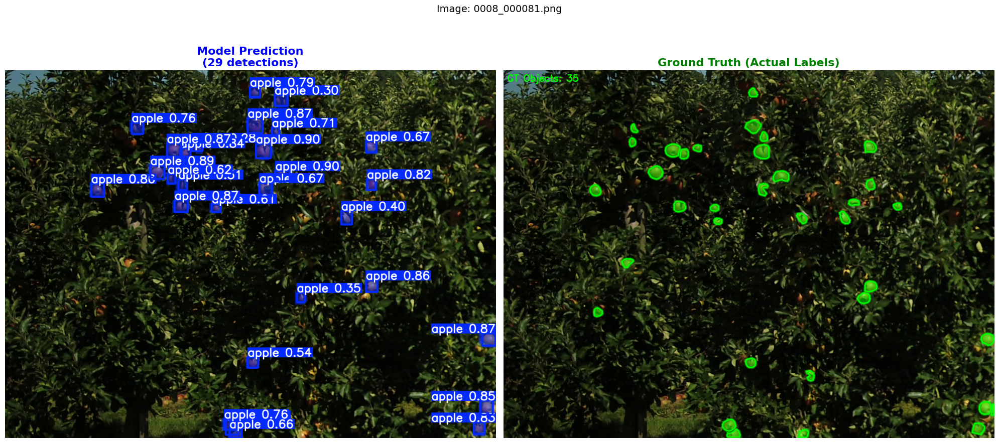


[2/6] Processing: 0012_000070.png


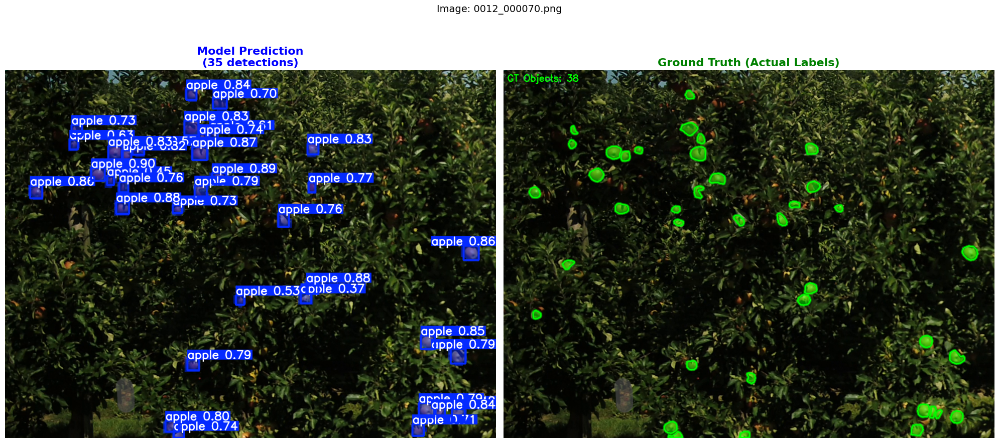


[3/6] Processing: 0008_000146.png


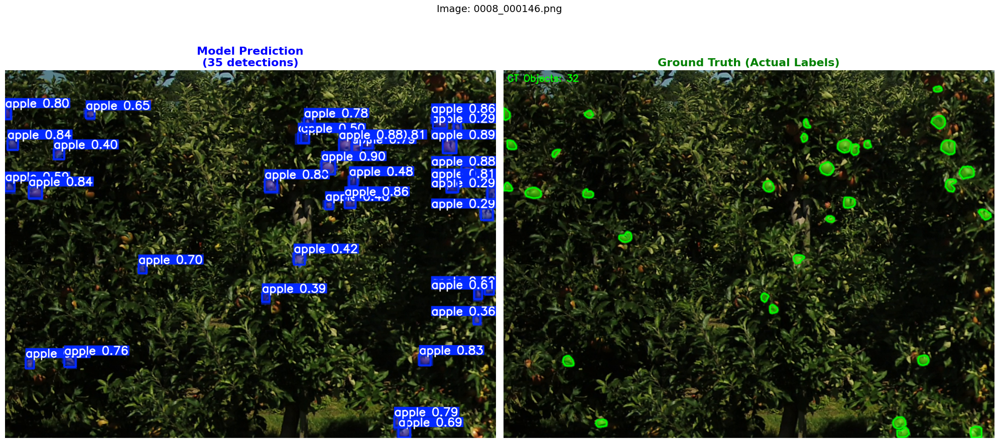


[4/6] Processing: 0006_000058.png


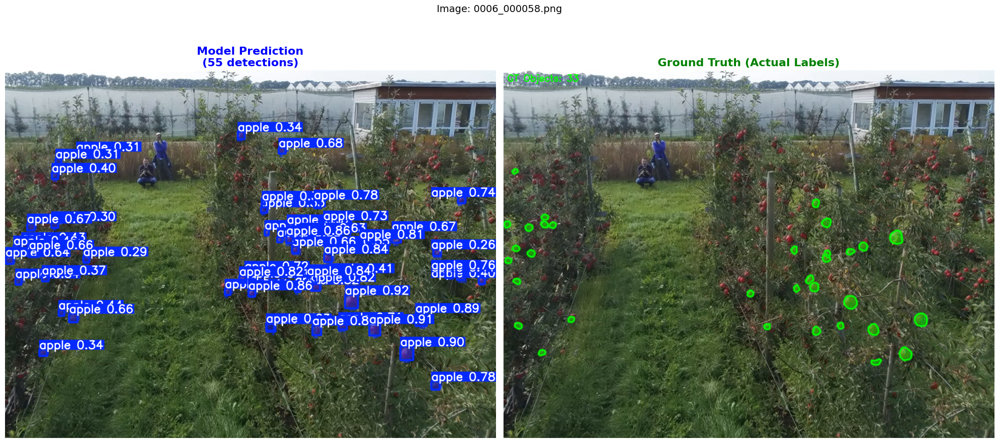


[5/6] Processing: 0012_000021.png


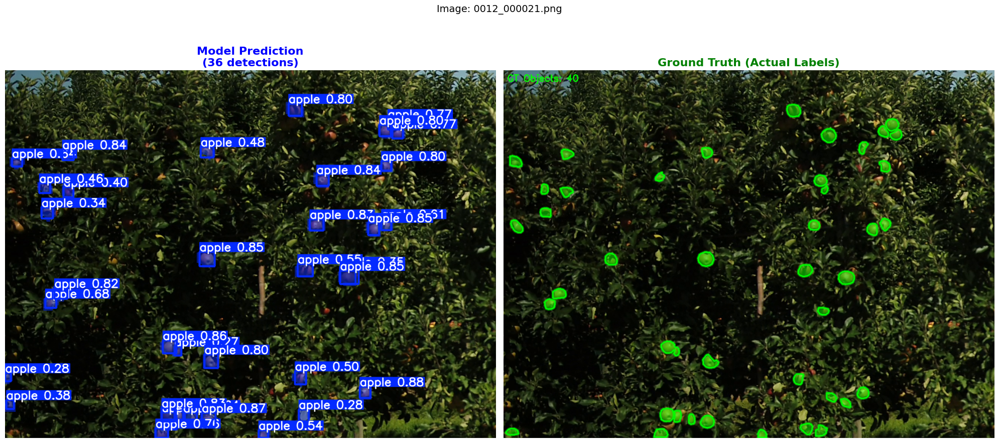


[6/6] Processing: 0012_000256.png


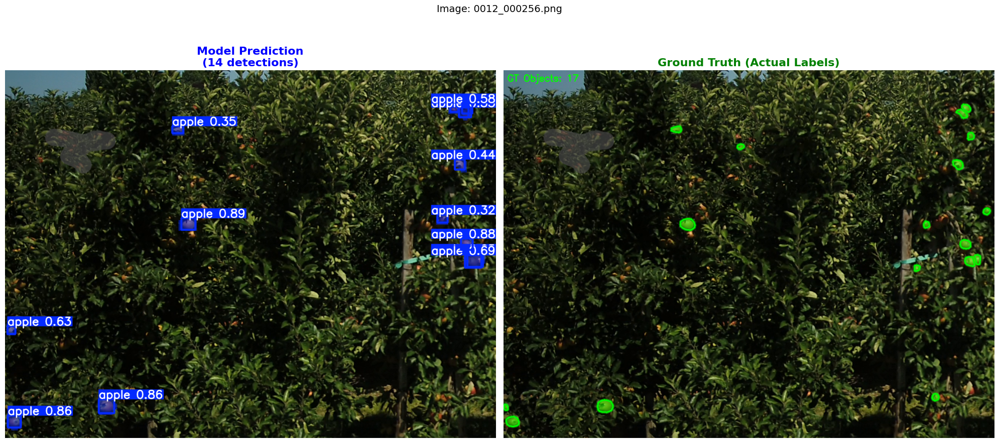



✅ Visualization complete!


In [10]:
# ==> VISUALIZATION: PREDICTIONS VS. ACTUAL LABELS WITH SEGMENTATION MASKS <==
from ultralytics import YOLO
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Helper Function to Draw Ground Truth Segmentation Masks ---
def draw_ground_truth(image_path, label_path):
    """
    Reads a YOLOv8 segmentation label file and draws the ground truth masks on the image.
    Returns an image with filled polygons and outlined boundaries.
    """
    # Read the original image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return None

    h, w, _ = image.shape

    # Create a transparent overlay for the masks
    overlay = image.copy()
    alpha = 0.5  # Transparency factor (0.0 = transparent, 1.0 = opaque)

    # Check if label file exists
    if not os.path.exists(label_path):
        # No annotations for this image
        cv2.putText(image, "No Ground Truth", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        return image

    try:
        with open(label_path, 'r') as f:
            lines = f.readlines()

        if len(lines) == 0:
            cv2.putText(image, "No Ground Truth", (10, 30),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            return image

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:  # Need at least class + 3 points (6 coordinates)
                continue

            # Class index is parts[0] (0 for 'apple')
            class_id = int(parts[0])

            # De-normalize polygon coordinates
            polygon_norm = np.array(parts[1:], dtype=np.float32)
            polygon_pixels = polygon_norm.reshape(-1, 2)
            polygon_pixels[:, 0] *= w  # x coordinates
            polygon_pixels[:, 1] *= h  # y coordinates
            polygon_pixels = polygon_pixels.astype(np.int32)

            # Draw the filled polygon on the overlay (green for ground truth)
            cv2.fillPoly(overlay, [polygon_pixels], color=(0, 255, 0), lineType=cv2.LINE_AA)

            # Draw the polygon outline (thicker green border)
            cv2.polylines(image, [polygon_pixels], isClosed=True,
                         color=(0, 255, 0), thickness=3, lineType=cv2.LINE_AA)

        # Blend the overlay with the original image for transparency
        image = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        # Add label count
        cv2.putText(image, f"GT Objects: {len(lines)}", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        return image

    except Exception as e:
        print(f"Error processing label file {label_path}: {e}")
        return image


# --- Main Visualization Logic ---

# 1. DEFINE PATHS (Update these to match your setup)
best_model_path = "/content/drive/MyDrive/YOLOv8_Apple_Training_CBAM/apple_segmentation_cbam4/weights/best.pt"
yolo_dataset_path = "/content/drive/MyDrive/AppleMOT_YOLOv8"
val_images_path = os.path.join(yolo_dataset_path, "images/val")
val_labels_path = os.path.join(yolo_dataset_path, "labels/val")

# Number of sample images to display
NUM_SAMPLES = 6

# 2. VERIFY PATHS EXIST
if not os.path.exists(best_model_path):
    print(f"❌ Model not found at: {best_model_path}")
    print("Please update the path to your trained model.")
else:
    print(f"✅ Model found: {best_model_path}")

if not os.path.exists(val_images_path):
    print(f"❌ Validation images not found at: {val_images_path}")
else:
    print(f"✅ Validation images found: {val_images_path}")

# 3. LOAD THE TRAINED MODEL
print("\n📦 Loading model...")
model = YOLO(best_model_path)
print("✅ Model loaded successfully!")

# 4. GET A LIST OF RANDOM IMAGES
image_files = [f for f in os.listdir(val_images_path)
               if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
print(f"\n📊 Found {len(image_files)} validation images")

if len(image_files) == 0:
    print("❌ No images found in validation set!")
else:
    sample_images = random.sample(image_files, min(NUM_SAMPLES, len(image_files)))

    # 5. LOOP, PREDICT, AND VISUALIZE
    print(f"\n🎨 Visualizing {len(sample_images)} samples...\n")

    for idx, image_name in enumerate(sample_images, 1):
        image_path = os.path.join(val_images_path, image_name)
        label_name = os.path.splitext(image_name)[0] + '.txt'
        label_path = os.path.join(val_labels_path, label_name)

        print(f"[{idx}/{len(sample_images)}] Processing: {image_name}")

        # --- Get Model Prediction ---
        results_list = model.predict(image_path, conf=0.25, verbose=False)
        prediction_array = results_list[0].plot()  # Returns BGR numpy array with visualizations

        # Count predictions
        num_predictions = len(results_list[0].boxes) if results_list[0].boxes is not None else 0

        # --- Get Ground Truth Visualization ---
        ground_truth_array = draw_ground_truth(image_path, label_path)

        if ground_truth_array is None:
            print(f"  ⚠️ Skipping {image_name} due to read error")
            continue

        # --- Display Side-by-Side using Matplotlib ---
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

        # Prediction Image (left)
        ax1.imshow(cv2.cvtColor(prediction_array, cv2.COLOR_BGR2RGB))
        ax1.set_title(f"Model Prediction\n({num_predictions} detections)",
                     fontsize=16, fontweight='bold', color='blue')
        ax1.axis('off')

        # Ground Truth Image (right)
        ax2.imshow(cv2.cvtColor(ground_truth_array, cv2.COLOR_BGR2RGB))
        ax2.set_title("Ground Truth (Actual Labels)",
                     fontsize=16, fontweight='bold', color='green')
        ax2.axis('off')

        # Add overall title
        fig.suptitle(f"Image: {image_name}", fontsize=14, y=0.98)

        plt.tight_layout()
        plt.show()
        print()

print("\n✅ Visualization complete!")